<div style="direction:rtl;line-height:300%;">
<font face="XB Zar" size=5>
<div align=center>
<font face="B Titr" size=5>
<p></p><p></p>
بسمه تعالی
<p></p>
</font>
<p></p>
<font>
<br>
درس بازیابی پیشرفته اطلاعات
<br>
مدرس: دکتر بیگی
</font>
<p></p>
<br>
<font>
<b>تمرین سوم</b>
</font>
<br>
<br>
موعد تحویل: ۴ دی <br>
<br>
<br>
<br>
<font>
دانشگاه صنعتی شریف
<br>
دانشکده مهندسی کامپیوتر
<br>
<br>
</font>
</div>
</font>
</div>

<span style="color: red;">
<div dir='rtl'>

<b> نام و نام‌‌خانوادگی: </b>
ابوالفضل اسحاق

<b> شماره دانشجویی: </b>
99101105

<b> لینک colab: </b>

https://colab.research.google.com/drive/1wud8mJ2J2TMtFw75fw0PHk_MLlyDhcpH#scrollTo=oxzfgL99FYbe-->
</div>
</span>

<div dir='rtl'>
<h1>
مقدمه
</h1>
<p>
در این تمرین قصد داریم به مباحث زیر بپردازیم:
<li> embedding </li>
<li> کلاسه‌بندی متن </li>
<li> کاهش ابعاد </li>
<li> خوشه‌بندی متن و هرس‌کردن خوشه‌ها</li>

دیتاست این تمرین از دیتاست‌های kaggle انتخاب شده‌است و لینک آن در بخش اول تمرین در اختیار شما قرار داده شده است.

کتابخانه‌های مورد نظرتان را هم می‌توانید در اولین سل نوت‌بوک فراخوانی کنید.
</p>
</div>

In [50]:
! pip install opendatasets

In [51]:
! pip install fasttext

In [52]:
import opendatasets as od
# import kaggle
import pandas as pd
import numpy as np
import string
import nltk
from nltk import word_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
from tqdm import tqdm
import fasttext
import sklearn

In [53]:
nltk.download("wordnet")
nltk.download("stopwords")
nltk.download("punkt")

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

<div dir='rtl'>
<h1>1.
دریافت و آماده‌سازی دیتاست
</h1>
<p>
دیتاست استفاده شده در این تمرین، مجموعه‌ای عناوین، خلاصه، و ژانر چندین کتاب است.
این دیتاست در kaggle موجود است.
ابتدا این دیتاست را با استفاده از kaggle api دریافت کنید و سپس آن را لود کنید.
<br/>
لینک دیتاست: https://www.kaggle.com/datasets/athu1105/book-genre-prediction
<br>
<i>در صورتی که با خطای 443 مواجه شدید، یا از پراکسی استفاده کنید یا از کولب.</i>
</p>
</div>

In [54]:
# TODO: Download Dataset (https://www.kaggle.com/datasets/athu1105/book-genre-prediction) Using Kaggle API


**NOTE THAT I DOWNLOADED AND USED THE DATASET MANUALLY**

In [55]:
# TODO: Load Dataset into df
dataset = pd.read_csv("data.csv")
df = dataset.dropna()

In [56]:
# all_docs
len(dataset), len(df)

(4657, 4657)

In [57]:
df['genre'].value_counts()

thriller      1023
fantasy        876
science        647
history        600
horror         600
crime          500
romance        111
psychology     100
sports         100
travel         100
Name: genre, dtype: int64

In [58]:
# TODO: Perform data cleaning and eda (you can add cells here)

<div dir='rtl'>
<p>
حال در این مرحله، به پیش‌پردازش متن می‌پردازیم. این پیش‌پردازش باید روی هر دو ستون title و summary اعمال شود.
برای پیش‌پردازش نیازی نیست که هرکدام از اعمال پیش‌پردازش را خودتان مانند تمارین قبل پیاده کنید. برای پیاده‌سازی تابع زیر می‌توانید از کتابخانه‌های معمول برای این کار بهره ببرید.
</p>
</div>

In [59]:
def preprocess_text(text, minimum_length=1, stopword_removal=True, stopwords_domain=[], lower_case=True,
                       punctuation_removal=True):
    """
    preprocess text by removing stopwords, punctuations, and converting to lowercase, and also filter based on a min length
    for stopwords use nltk.corpus.stopwords.words('english')
    for punctuations use string.punctuation

    Parameters
    ----------
    text: str
        text to be preprocessed
    minimum_length: int
        minimum length of the token
    stopword_removal: bool
        whether to remove stopwords
    stopwords_domain: list
        list of stopwords to be removed based on domain
    lower_case: bool
        whether to convert to lowercase
    punctuation_removal: bool
        whether to remove punctuations
    """
    tokens = word_tokenize(text)

    if stopword_removal:
        stop_words = set(nltk.corpus.stopwords.words('english'))
        tokens = [word for word in tokens if word.lower() not in stop_words and len(word) > minimum_length]

    if punctuation_removal:
        tokens = [word for word in tokens if word not in string.punctuation]

    if lower_case:
        tokens = [word.lower() for word in tokens]

    if stopwords_domain:
        tokens = [word for word in tokens if word.lower() not in stopwords_domain]

    return tokens

In [60]:
# Apply preprocess text on both title and summary columns
df['title_tokens'] = df['title'].apply(preprocess_text)
df['summary_tokens'] = df['summary'].apply(preprocess_text)

In [61]:
df['title_tokens'],df['title']

(0                [drowned, wednesday]
 1                        [lost, hero]
 2                   [eyes, overworld]
 3                [magic, 's, promise]
 4                   [taran, wanderer]
                     ...              
 4652                        [hounded]
 4653    [charlie, chocolate, factory]
 4654                    [red, rising]
 4655                      [frostbite]
 4656                       [radiance]
 Name: title_tokens, Length: 4657, dtype: object,
 0                       Drowned Wednesday
 1                           The Lost Hero
 2               The Eyes of the Overworld
 3                         Magic's Promise
 4                          Taran Wanderer
                       ...                
 4652                              Hounded
 4653    Charlie and the Chocolate Factory
 4654                           Red Rising
 4655                            Frostbite
 4656                             Radiance
 Name: title, Length: 4657, dtype: object)

In [ ]:
df['summary_tokens'], df['summary']

(0       [drowned, wednesday, first, trustee, among, mo...
 1       [book, opens, jason, awakens, school, bus, una...
 2       [cugel, easily, persuaded, merchant, fianosthe...
 3       [book, opens, herald-mage, vanyel, returning, ...
 4       [taran, gurgi, returned, caer, dallben, follow...
                               ...                        
 4652    [atticus, sullivan, last, druids, lives, peace...
 4653    [charlie, bucket, 's, wonderful, adventure, be...
 4654    [``, live, dream, children, born, free, '', sa...
 4655    [rose, loves, dimitri, dimitri, might, love, t...
 4656    [prince, value, brishen, khaskem, prince, kai,...
 Name: summary_tokens, Length: 4657, dtype: object,
 0        Drowned Wednesday is the first Trustee among ...
 1        As the book opens, Jason awakens on a school ...
 2        Cugel is easily persuaded by the merchant Fia...
 3        The book opens with Herald-Mage Vanyel return...
 4        Taran and Gurgi have returned to Caer Dallben...
    

In [ ]:
# X = [df['title'][row] + df['summary'][row] for row in range(len(df))]

In [ ]:
# X

['Drowned Wednesday Drowned Wednesday is the first Trustee among the Morrow Days who is on Arthur\'s side and wishes the Will to be fulfilled. She appears as a leviathan/whale and suffers from Gluttony. The book begins when Leaf is visiting Arthur and they are discussing the invitation that Drowned Wednesday sent him. Arthur had been admitted to hospital because of the damage done to his leg when he attempted to enter Tuesday\'s Treasure Tower. Suddenly, the hospital room becomes flooded with water as the two are transported to the Border Sea of the House. Leaf is snatched away by a large ship with green sails, known as the Flying Mantis, while Arthur remains in his bed. When the Medallion given him by the immortal called the Mariner apparently fails to summon help, Arthur is without hope. Eventually, a buoy marking the pirate Elishar Feverfew\'s treasure floats toward him. As soon as Arthur opens it, his hand is marked with a bloody red colour. Arthur now has the Red Hand, by which Fe

<div dir="rtl">
در نهایت بعد از اپلای کردن پیش‌پردازش روی هر دو ستون، دو ستون پیش‌پردازش شده را با هم ادغام کنید و آن را در یک آرایه به نام X قرار دهید.
</div>

<div dir="rtl">
<h2>1-1.
Embedding
</h2>

در این قسمت از fasttext کمک می‌گیریم تا به یک embedding اولیه برای هر کتاب برسیم.
    با استفاده از داده‌هایی که داریم یک مدل fasttext آموزش دهید که برای هر توکن یک امبدینگ ۱۰۰تایی بدهد.
    در مرحله‌ی بعد میانگین وزن دار امبدینگ های fasttext
        توکن‌های ورودی (چکیده + عنوان)
    را بر اساس tfidif آن‌ها محاسبه کنید و به امبدینگ نهایی متن برسید.
    <br>
    در واقع به عبارت ساده‌تر بر اساس میانگین وزن‌دار که وزن‌های ما tfidf توکن‌ها می‌باشد به امبدینگ نهایی متن بر اساس fasttext می‌رسیم.
</div>

In [62]:
class FastText:

    def __init__(self, preprocessor=None, method='skipgram'):
        self.method = method
        self.model = None
        self.preprocessor = preprocessor

    def train(self, texts):
        """
        train the fasttext model and save it into self.model
        Parameters
        ----------
        texts: list of list of str
        """

        # Merge all texts
        all_texts = "\n".join([" ".join(text) for text in texts])
        with open("ignore.txt", "w") as f:
            f.write(all_texts)

        self.model = fasttext.train_unsupervised('ignore.txt', self.method, dim=100)

    def get_query_embedding(self, query, tf_idf_vectorizer):
        """
        get the embedding of the query. You can use the tf_idf_vectorizer to get the weights of the words in the query. preprocess the query using self.preprocessor if it is not None
        Parameters
        ----------
        query: str
        tf_idf_vectorizer: TfidfVectorizer
        Returns embedding of the query
        """
        if self.preprocessor:
            query = self.preprocessor(query)

        tf_idf_vector = tf_idf_vectorizer.transform([" ".join(query)])
        doc_vector = tf_idf_vector.toarray()[0]
        feature_names = tf_idf_vectorizer.get_feature_names_out()

        tfidf_values = {feature_names[i]: doc_vector[i] for i in range(len(feature_names))}

        # query_tokens = word_tokenize(query)
        embedding = np.zeros(100)  # assuming embedding size is 100
        total_weight = 0
        for token in query:
            if token in tfidf_values:
                # tf_idf_weight = tf_idf_vectorizer.transform([token]).toarray()[0][0]
                tf_idf_weight = tfidf_values[token]
                embedding += tf_idf_weight * self.model[token]
                # total_weight += tf_idf_weight
                total_weight += tfidf_values[token]
        if total_weight > 0:
            embedding /= total_weight
        return embedding

    def save_FastText_model(self, path='FastText_model.bin'):
        self.model.save_model(path)

    def load_FastText_model(self, path="FastText_model.bin"):
        self.model = fasttext.load_model(path)

    def prepare(self, dataset, mode, save=False):
        if mode == 'train':
            self.train(dataset)
        if mode == 'load':
            self.load_FastText_model()
        if save:
            self.save_FastText_model()


In [63]:
df['merged_tokens'] = df['title_tokens'] + df['summary_tokens']
ft_model = FastText(preprocess_text)
ft_model.train(df['merged_tokens'])

In [64]:
ft_model.model.get_nearest_neighbors("arbitrary", k=5)

[(0.9059416651725769, 'architecture'),
 (0.899296760559082, 'architectural'),
 (0.8948280811309814, 'temporary'),
 (0.8930896520614624, 'architect'),
 (0.8891151547431946, 'archaeology')]

<div dir="rtl">
در این مرحله آرایه X را روی TFIDF فیت می‌کنیم.
</div>

In [65]:
# # fit X on tfidf
class TF_IDF:

    def __init__(self):
        self.vectorizer = TfidfVectorizer()

    def fit_vectorizer(self, data):
        """
        fit the vectorizer on the data
        Parameters
        ----------
        data: list of list of str
        """
        self.vectorizer.fit([" ".join(tokens) for tokens in data])

In [66]:
# TODO: Fit TFIDF Vectorizer on X
tfidf_model = TF_IDF()
tfidf_model.fit_vectorizer(df['merged_tokens'])
tfidf = tfidf_model.vectorizer.transform([" ".join(x) for x in df['merged_tokens']])


In [67]:
# TODO: Get Embedding of an arbitrary query using your prior implemention
ft_model.get_query_embedding("This book is amazing!", tfidf_model.vectorizer)

array([ 3.27906028e-01, -5.83581347e-03, -6.18336364e-02,  1.44383104e-01,
       -5.97982819e-02, -3.66486911e-02, -2.34893666e-01, -3.81107328e-01,
       -7.40811573e-02,  2.11644693e-01,  4.62942649e-01,  1.32970504e-01,
       -2.85138485e-01,  4.21698093e-01,  6.14214653e-02,  1.08935670e-01,
       -1.60500373e-02, -1.96740214e-01, -9.74881270e-02, -1.84767837e-01,
        1.46918200e-01, -1.18555968e-01, -1.67301523e-01, -4.86186002e-01,
       -1.85209375e-01, -4.79491278e-02,  4.01989668e-01,  2.18708612e-01,
       -5.46346804e-01,  3.93691015e-01, -2.64934081e-01,  2.60993926e-01,
        7.49120688e-02,  4.32098046e-01, -3.45846481e-01,  2.92658713e-01,
       -1.71650111e-01, -7.33298992e-02, -2.47331452e-01,  1.88700231e-01,
        1.40280590e-01, -2.18574349e-01,  1.05043609e-02, -1.87764503e-01,
       -4.20075508e-01, -4.91434142e-01,  3.20855621e-01,  1.87574677e-01,
        1.70874460e-01, -1.65704487e-01,  1.20468411e-01, -1.89013563e-01,
       -5.10087084e-01,  

In [68]:
from tqdm import tqdm
import numpy as np
X = df['merged_tokens']

# Step 1: Flatten the list of lists
all_tokens = [token for sublist in X for token in sublist]

# Step 2: Create vocabulary set
vocab = set(all_tokens)
vocab_size = len(vocab)

# Step 3: Initialize list for embeddings
all_embeddings = []

# Step 4: Compute embeddings using tqdm for progress tracking
with tqdm(X, desc="Computing Embeddings") as tq:
    for x in tq:
        text = " ".join(x)
        embedding = ft_model.get_query_embedding(text, tfidf_model.vectorizer)
        all_embeddings.append(embedding)

# Step 5: Convert embeddings to NumPy array
X = np.asarray(all_embeddings)



Computing Embeddings: 100%|██████████| 4657/4657 [04:52<00:00, 15.92it/s]


In [ ]:
# X = df['merged_tokens']

In [ ]:
# all_tokens = []
# for x in X:
#   all_tokens += x
# vocab = set(all_tokens)
# len(vocab)

In [ ]:
# X

In [ ]:
# # TODO: Get embedding on each document in X
# from tqdm import tqdm
# all_embeddings = []
# with tqdm(X) as tq:
#   for i, x in enumerate(tq):
#     all_embeddings.append(ft_model.get_query_embedding(" ".join(x), tfidf_model.vectorizer))

In [ ]:

# X = np.asarray(all_embeddings)

<div dir="rtl">
در نهایت، تمامی entry های درون X را به صورت امبدینگ دربیاورید و آن را در X ذخیره کنید.
</div>

<div dir='rtl'>
<h2>1-2.
آماده‌سازی داده تمرین و تست
</h2>
<p>
در این بخش ابتدا می‌خواهیم تا داده‌ای که می‌خواهیم بر اساس آن کلاسه‌بندی کتاب‌ها را انجام دهیم، که همان ژانر کتاب‌ها است را انکود کنیم.
<br>
سپس با جداسازی داده آموزش و تست، به آموزش مدل‌های کلاسه‌بند می‌پردازیم.
</p>
</div>

In [69]:
# Step 6: Reshape embeddings
X = np.asarray([x.reshape(-1) for x in all_embeddings])

In [ ]:
# X = np.asarray([x.reshape(-1) for x in all_embeddings])

In [70]:
# TODO: Encode genres with values between 0 and n_classes-1 and save it in array Y
all_genres = df['genre'].tolist()
unique_genres = list(set(all_genres))
genre_enum = {x:i for i, x in enumerate(unique_genres)}
Y = np.asarray([genre_enum[g] for g in all_genres])

In [71]:
# TODO: Split data into train and test (test size = 20%)
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=41)
X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

((3725, 100), (932, 100), (3725,), (932,))

In [72]:
X_train, X_test, Y_train, Y_test

(array([[ 0.32040688,  0.07398318, -0.08488623, ..., -0.15886637,
          0.05940954, -0.18524345],
        [ 0.30073907, -0.06539923, -0.02739625, ..., -0.11938092,
          0.26120931, -0.15484838],
        [ 0.30146636, -0.03036922, -0.02809594, ..., -0.17109609,
          0.14373586, -0.16105083],
        ...,
        [ 0.27767304,  0.02148707, -0.02108715, ..., -0.14127035,
          0.08382642, -0.14020675],
        [ 0.34104411, -0.0644497 , -0.06255965, ..., -0.17792828,
          0.15889101, -0.13005898],
        [ 0.3060424 , -0.04015393,  0.00616204, ..., -0.15025188,
          0.18176367, -0.15398246]]),
 array([[ 3.30709106e-01,  2.58494307e-03, -2.09156488e-02, ...,
         -1.61069455e-01,  9.07446912e-02, -1.54336178e-01],
        [ 2.14465153e-01, -2.69614756e-02, -6.71610138e-02, ...,
          2.99173019e-04,  3.76473412e-01, -1.67968819e-01],
        [ 3.55223796e-01, -4.59776642e-02, -1.01652517e-01, ...,
         -1.37562171e-01,  1.85776915e-01, -1.47795260e-

<div dir="rtl">
<h1>2.
کلاسه‌بندی متن
</h1>
در این بخش می‌خواهیم تا با استفاده از داده‌هایی که داریم، سه مدل کلاسه‌بندی متن را آموزش دهیم و عملکرد آن‌ها را با هم مقایسه کنیم.
</div>

<div dir="rtl">
<h2>2-1.
SVM و Naive Bayes
</h2>
با استفاده از توابع آماده در sklearn، کلاسه‌بند SVM و Naive Bayes را روی داده آموزش تمرین دهید. سپس، ژانر داده تست را با استفاده از مدل آموزش داده شده پیش‌بینی کنید و آن را در آرایه‌های NB_prediction و SVM_prediction ذخیره کنید.</div>

In [73]:
# Clustering text
# Train Sklearn's SVM and Naive Bayes implementation on X_train and Y_train
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix


In [74]:
# SVM
svm_model = SVC(kernel='linear')
svm_model.fit(X_train, Y_train)
SVM_prediction = svm_model.predict(X_test)

In [75]:
# TODO: Predict on X_test using the trained models
# Naive Bayes Model
nb_model = GaussianNB()
nb_model.fit(X_train, Y_train)
NB_prediction = nb_model.predict(X_test)

<div dir="rtl">
<h2>2-2.  
Rocchio
</h2>
می‌خواهیم روش Rocchio را از
پایه پیاده‌سازی کنیم.
با توجه به شواهد نوشته شده هر تابع را کامل کنید و با آموزش مدل روی داده‌های train
لیبل‌های داده‌های test
را پیش بینی کنید و آن را در rocchio_prediction ذخیره کنید.
</div>

In [76]:


class RocchioTextClassifier:
    def __init__(self, preprocessor=None):
        self.preprocessor = preprocessor
        self.centroids = None

    def calculate_centroids(self, X, y):
        unique_labels = np.unique(y)
        self.centroids = {label: np.mean(X[y == label], axis=0) for label in unique_labels}

    def predict_label(self, x):
        distances = {label: np.linalg.norm(x - centroid) for label, centroid in self.centroids.items()}
        return min(distances, key=distances.get)

    def predict(self, X):
        return np.array([self.predict_label(x) for x in X])

In [77]:
# TODO: Train your Rocchio implementation on X_train and Y_train
rocchio_model = RocchioTextClassifier()
rocchio_model.calculate_centroids(X_train, Y_train)
rocchio_prediction = rocchio_model.predict(X_test)

In [ ]:
# TODO: Predict on X_test using the trained model

<div dir="rtl">
<h2>2-3.
ارزیابی
</h2>
برای هر سه روش پیاده‌سازی شده، معیار‌های ارزیابی زیر را بررسی کنید.
<br>
f1 score, accuracy, precision, recall
<br>
سپس، نتایج به دست آمده را با هم در چهار نمودار مقایسه کنید.
</div>

In [78]:
# TODO: Run evaluation metrics on the predictions
from sklearn.metrics import accuracy_score, classification_report
svm_accuracy = accuracy_score(Y_test, SVM_prediction)
print("SVM:\n", classification_report(Y_test, SVM_prediction))

# Evaluate the Naive Bayes Classifier
nb_accuracy = accuracy_score(Y_test, NB_prediction)
print("Naive Bayes:\n", classification_report(Y_test, NB_prediction))

# Evaluate the Rocchio Classifier
nb_accuracy = accuracy_score(Y_test, rocchio_prediction)
print("Rocchio:\n", classification_report(Y_test, rocchio_prediction))

SVM:
               precision    recall  f1-score   support

           0       0.50      0.16      0.24        19
           1       0.66      0.69      0.67       185
           2       0.50      0.05      0.09        20
           3       0.78      0.40      0.53       108
           4       0.64      0.44      0.52       124
           5       0.67      0.50      0.57        12
           6       0.00      0.00      0.00        20
           7       0.44      0.73      0.55       188
           8       0.74      0.73      0.74       128
           9       0.59      0.66      0.62       128

    accuracy                           0.59       932
   macro avg       0.55      0.44      0.45       932
weighted avg       0.61      0.59      0.58       932

Naive Bayes:
               precision    recall  f1-score   support

           0       0.14      0.84      0.23        19
           1       0.65      0.44      0.53       185
           2       0.22      0.55      0.32        20
    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


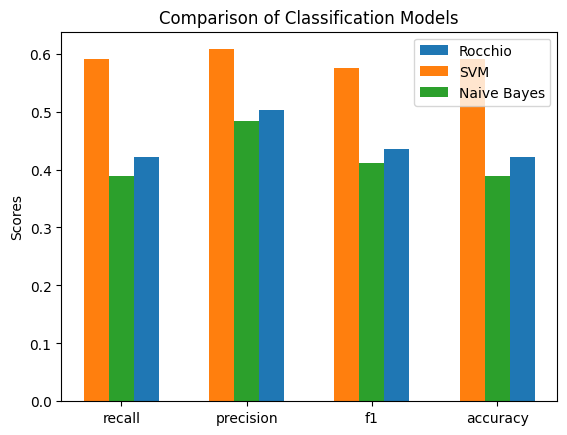

In [79]:
from sklearn.metrics import f1_score, accuracy_score, recall_score, precision_score
import matplotlib.pyplot as plt

def calculate_metrics(y_true, y_pred):
    return {
        'recall': recall_score(y_true, y_pred, average='weighted'),
        'precision': precision_score(y_true, y_pred, average='weighted'),
        'f1': f1_score(y_true, y_pred, average='weighted'),
        'accuracy': accuracy_score(y_true, y_pred)
    }

# Calculate metrics for each model
svm_metrics = calculate_metrics(Y_test, SVM_prediction)
nb_metrics = calculate_metrics(Y_test, NB_prediction)
rocchio_metrics = calculate_metrics(Y_test, rocchio_prediction)

# Prepare data for plotting
labels = list(svm_metrics.keys())
svm_values = list(svm_metrics.values())
nb_values = list(nb_metrics.values())
rocchio_values = list(rocchio_metrics.values())

x = range(len(labels))
width = 0.2

# Plotting
fig, ax = plt.subplots()

ax.bar([i + width for i in x], rocchio_values, width, label='Rocchio')
ax.bar([i - width for i in x], svm_values, width, label='SVM')
ax.bar(x, nb_values, width, label='Naive Bayes')

# Set labels and title
ax.set_ylabel('Scores')
ax.set_title('Comparison of Classification Models')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

# Show the plot
plt.show()

In [ ]:
# from sklearn.metrics import f1_score, accuracy_score, recall_score, precision_score
# import matplotlib.pyplot as plt

# def calculate_metrics(y_true, y_pred):
#     return {
#         'recall': recall_score(y_true, y_pred, average='weighted'),
#         'precision': precision_score(y_true, y_pred, average='weighted'),
#         'f1': f1_score(y_true, y_pred, average='weighted'),
#         'accuracy': accuracy_score(y_true, y_pred)
#     }

# svm_metrics = calculate_metrics(Y_test, SVM_prediction)
# nb_metrics = calculate_metrics(Y_test, NB_prediction)
# rocchio_metrics = calculate_metrics(Y_test, rocchio_prediction)

# labels = list(svm_metrics.keys())
# svm_values = list(svm_metrics.values())
# nb_values = list(nb_metrics.values())
# rocchio_values = list(rocchio_metrics.values())

# x = range(len(labels))
# width = 0.2

# fig, ax = plt.subplots()


# ax.bar([i + width for i in x], rocchio_values, width, label='Rocchio')
# ax.bar([i - width for i in x], svm_values, width, label='SVM')
# ax.bar(x, nb_values, width, label='Naive Bayes')

# ax.set_ylabel('Scores')
# ax.set_title('Comparison of Classification Models')
# ax.set_xticks(x)
# ax.set_xticklabels(labels)
# ax.legend()

# plt.show()

In [ ]:
# from sklearn.metrics import confusion_matrix
# import seaborn as sns
# import matplotlib.pyplot as plt

# def plot_confusion_matrix(conf_matrix, title):
#     sns.heatmap(conf_matrix, annot=True, fmt='g')
#     plt.title(f'{title} Confusion Matrix')
#     plt.xlabel('Predicted labels')
#     plt.ylabel('True labels')

# # Calculate confusion matrices
# conf_matrices = {
#     'SVM': confusion_matrix(Y_test, SVM_prediction),
#     'Naive Bayes': confusion_matrix(Y_test, NB_prediction),
#     'Rocchio': confusion_matrix(Y_test, rocchio_prediction)
# }

# # Plot confusion matrices
# fig, axes = plt.subplots(1, len(conf_matrices), figsize=(18, 5))

# for ax, (model, conf_matrix) in zip(axes, conf_matrices.items()):
#     plot_confusion_matrix(conf_matrix, model)
#     ax.set_title(f'{model} Confusion Matrix')

# # Adjust layout for better visualization
# plt.tight_layout()

# # Show the plot
# plt.show()

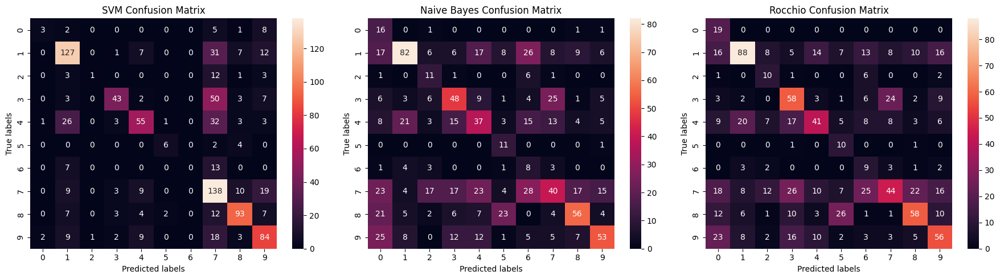

In [80]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# TODO: Draw confusion matrix
conf_matrix_svm = confusion_matrix(Y_test, SVM_prediction)
conf_matrix_nb = confusion_matrix(Y_test, NB_prediction)
conf_matrix_rocchio = confusion_matrix(Y_test, rocchio_prediction)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# SVM Confusion Matrix
sns.heatmap(conf_matrix_svm, annot=True, ax=axes[0], fmt='g')
axes[0].set_title('SVM Confusion Matrix')
axes[0].set_xlabel('Predicted labels')
axes[0].set_ylabel('True labels')

# Naive Bayes Confusion Matrix
sns.heatmap(conf_matrix_nb, annot=True, ax=axes[1], fmt='g')
axes[1].set_title('Naive Bayes Confusion Matrix')
axes[1].set_xlabel('Predicted labels')
axes[1].set_ylabel('True labels')

# Rocchio Confusion Matrix
sns.heatmap(conf_matrix_rocchio, annot=True, ax=axes[2], fmt='g')
axes[2].set_title('Rocchio Confusion Matrix')
axes[2].set_xlabel('Predicted labels')
axes[2].set_ylabel('True labels')

plt.tight_layout()
plt.show()

<div dir="rtl">
کدام مدل از همه دقیق‌تر عمل کرد؟ نتیجه‌گیری و تحلیل خود از نتایج ارزیابی را گزارش دهید.
</div>

Obviously the SVM model was the best classifier amongst these three, it was the best in every measuring method, its extraordinary performance is due to some simple reasons, one is that SVM works very good in high dimensions like here, another is the fact that it is generally a much more complex model than the other two.

<!-- <span style="color: red;">#TODO: Write your answer in here.</span> -->


<div dir="rtl">
<h1>3.
کاهش ابعاد و خوشه‌بندی متن
</h1>
</div>

<div dir="rtl">
<h2>3-1.
کاهش ابعاد
</h2>
</div>

<div dir="rtl">
<h3>3-1-1.
PCA
</h3>
یکی از روش‌های کاهش ابعاد، PCA است. با استفاده از پیاده‌سازی آن در کتابخانه sklearn، ابعاد ویژگی‌های X را کاهش دهید.
<br>
سپس با استفاده از explained_variance_ratio_ در الگوریتم PCA  نشان دهید که با وجود یک ترشولد 90 درصد تا چه میزان میتوان ابعاد ویژگی ها را کم تر کرد.
</div>

In [81]:

from sklearn.decomposition import PCA

def reduce_dimension(embedding, n_components):
    pca = PCA(n_components=n_components)
    reduced_embeddings = pca.fit_transform(embedding)
    explained_variance_ratio = pca.explained_variance_ratio_.cumsum()
    return explained_variance_ratio


<div dir="rtl">
در این قسمت می‌توانید برای شهود بهتر، نمودار رسم کنید و همچنین برای ساده‌تر شدن کار، از pipeline‌های sklearn بهره ببرید.
<br>
<i> انجام این کار‌ها صرفا توصیه است و اجباری نیست. </i>
</div>

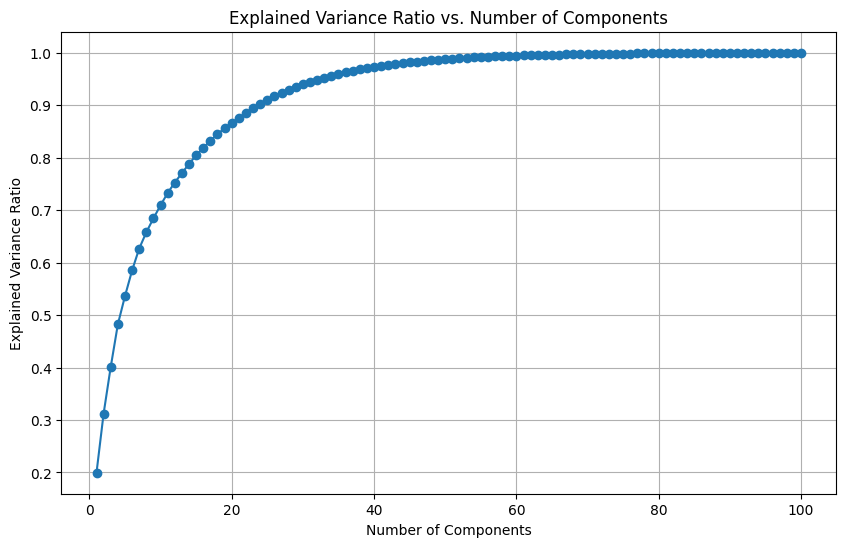

In [82]:
# Find out the most reduced dimension which has a 90% cutoff explained variance
reduced_dimensions = reduce_dimension(X, n_components=X.shape[1])

# Plot explained variance ratio
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(reduced_dimensions) + 1), reduced_dimensions, marker='o')
plt.title('Explained Variance Ratio vs. Number of Components')
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance Ratio')
plt.grid(True)
plt.show()

In [83]:
# Print the number of components for 90% explained variance
reduced_dimensions_90_percent = np.argmax(reduced_dimensions >= 0.9) + 1
print(f"Number of components for 90% explained variance: {reduced_dimensions_90_percent}")

Number of components for 90% explained variance: 24


<div dir="rtl">
<h3>3-1-2.
TSNE
</h3>
<br>
     برای اینکه بتوانید در مراحل بعدی، نتایج خوشه‌بندی را مشاهده کنید، در این قسمت به پیاده‌سازی تابع کاهش بعد بردارهای جاسازی با استفاده از روش T-SNE می‌پردازید.
برای اینکار تابع convert_to_2d_tsne را پیاده‌سازی می‌کنید که لیستی از بردارهای جاسازی را به عنوان ورودی دریافت می‌کند و در خروجی، لیستی از بردارهای جاسازی کاهش بعد داده شده به دو بعد را تولید می‌کند. برای پیاده سازی این تابع می‌توانید از کتابخانه‌های آماده استفاده کنید.
<br>
توجه کنید که از بردارهای خروجی این قسمت <u>صرفا برای رسم نمودار</u> استفاده می‌کنید و تمامی مراحلی که در ادامه طی می‌کنید (به جز رسم نمودار)، باید با استفاده از بردارهای کاهش بعد داده <u>نشده</u> انجام شوند.
</div>


In [84]:
from typing import List
from sklearn.manifold import TSNE

def convert_to_2d_tsne(emb_vecs):
    tsne = TSNE(n_components=2, random_state=42)
    return tsne.fit_transform(emb_vecs)

In [85]:
# TODO: Uncomment the following code
X_2d = convert_to_2d_tsne(np.array(X))

In [86]:
X_2d.shape

(4657, 2)

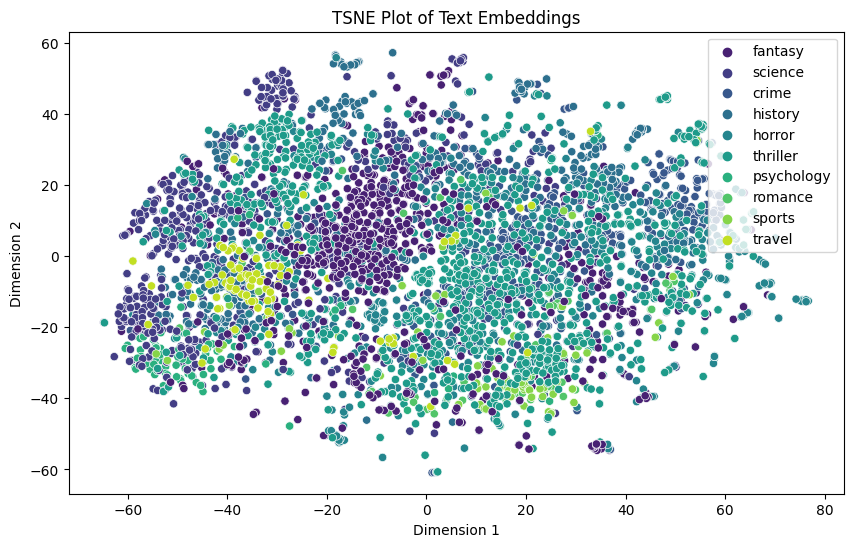

In [87]:
# Plot TSNE results
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_2d[:, 0], y=X_2d[:, 1], hue=df['genre'], palette='viridis', legend='full')
plt.title('TSNE Plot of Text Embeddings')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend(loc='upper right')
plt.show()

<div dir="rtl">
<h2>3-2.
خوشه‌بندی
</h2>
</div>

<div dir="rtl">
<h3>3-2-1.
K-Means
</h3>

<div dir="rtl">
در این قسمت، شما ابتدا الگوریتم خوشه‌بندی K-means را
<u><b>از پایه</b></u>
 پیاده‌سازی می‌کنید.

</div>

In [88]:
from typing import List
import random

# def cluster_kmeans(emb_vecs, n_clusters):
#     """
#     Clusters input vectors using K-means method

#     Parameters
#     ----------
#     emb_vecs : List
#         A list of vectors

#     n_clusters: int
#         Number of clusters

#     Returns
#     -------
#     list
#         Two lists: 1) A list containing cluster centers 2) A list containing cluster index for each input vector
#     """

#     # TODO: Implement K-means method from scratch
#     # You can't use sklearn.cluster.KMeans for clustering
#     # implement kmeans clustering here
#     emb_matrix = None

#     # Randomly initialize centroids
#     initial_centroids = None

#     for _ in range(None):  # You can adjust the number of iterations
#         # Compute distances between data points and centroids
#         distances = None

#         # Assign each point to the closest centroid
#         cluster_indices = None

#         # Update centroids
#         new_centroids = []


#     return initial_centroids.tolist(), cluster_indices.tolist()

# K-means clustering from scratch
def cluster_kmeans(emb_vecs, n_clusters, max_iterations=100):
    emb_matrix = np.array(emb_vecs)

    # Randomly initialize centroids
    initial_centroids = random.sample(list(emb_matrix), n_clusters)

    for _ in range(max_iterations):
        # Compute distances between data points and centroids
        distances = np.linalg.norm(emb_matrix[:, np.newaxis, :] - np.array(initial_centroids), axis=2)

        # Assign each point to the closest centroid
        cluster_indices = np.argmin(distances, axis=1)

        # Update centroids
        new_centroids = [np.mean(emb_matrix[cluster_indices == i], axis=0) for i in range(n_clusters)]
        initial_centroids = new_centroids

    return initial_centroids, cluster_indices

<div dir="rtl">
 با استفاده از K-Means خوشه‌های اسناد را ایجاد کنید. الگوریتم را با استفاده از چند مقدار مختلف تعداد خوشه‌ها (k) اجرا کنید. در هربار اجرا، با استفاده از تعدادی از اسناد موجود در هر خوشه، موضوع آن خوشه را تعیین کرده و خوشه‌بندی حاصله را با استفاده از بردار‌های دوبعدی قسمت قبل، رسم کنید. با اینکار، پیاده‌سازی خود و همچنین کارایی این الگوریتم در خوشه‌بندی اسناد و قرار دادن اسناد مشابه در خوشه‌های یکسان را بررسی کنید.
<br>
 نمودار silhouette score برای مقدار‌های مختلف k را رسم کرده و silhouette analysis برای انتخاب k مناسب انجام دهید.
 همچنین با استفاده از داده‌های دارای برچسب، مقدار purity به ازای k را رسم کرده و مقدار purity برای k نهایی را گزارش کنید.
<br>
</div>

In [89]:
# Using k-means create clusters
n_clusters = 3  # You can choose a different number of clusters
cluster_centers, cluster_indices = cluster_kmeans(X, n_clusters)


In [90]:
# from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [91]:
import numpy as np

def kmeans(X, k, max_iters=100, tol=1e-4):
    """
    K-means clustering algorithm from scratch.

    Parameters
    ----------
    X : array-like, shape (n_samples, n_features)
        Input data.

    k : int
        Number of clusters.

    max_iters : int, optional, default: 100
        Maximum number of iterations.

    tol : float, optional, default: 1e-4
        Tolerance to declare convergence.

    Returns
    -------
    centroids : array, shape (k, n_features)
        Final cluster centers.

    labels : array, shape (n_samples,)
        Index of the cluster each sample belongs to.

    iters : int
        Number of iterations performed.
    """
    n_samples, n_features = X.shape

    # Initialize centroids randomly
    centroids = X[np.random.choice(n_samples, k, replace=False)]

    iters = 0
    while iters < max_iters:
        # Assignment step: Assign each point to the nearest centroid
        labels = np.argmin(np.linalg.norm(X[:, np.newaxis] - centroids, axis=2), axis=1)

        # Update step: Recalculate centroids based on the assigned points
        new_centroids = np.array([X[labels == i].mean(axis=0) for i in range(k)])

        # Check for convergence
        if np.linalg.norm(new_centroids - centroids) < tol:
            break

        centroids = new_centroids
        iters += 1

    return centroids, labels, iters

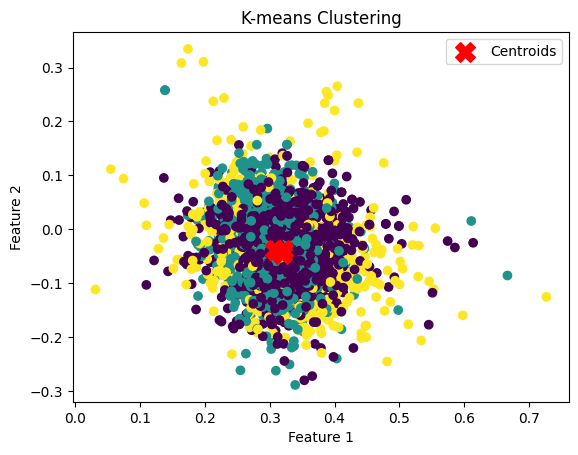

In [92]:
# testing with a random k
k = 3
centroids, labels, iters = kmeans(X, k)

# Display the results
# print(f"Centroids:\n{centroids}")
# print(f"Iterations: {iters}")

# Plot the clustered points
plt.scatter(X[:, 0], X[:, 1], c=labels, cmap='viridis')
plt.scatter(centroids[:, 0], centroids[:, 1], marker='X', s=200, c='red', label='Centroids')
plt.title('K-means Clustering')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.show()

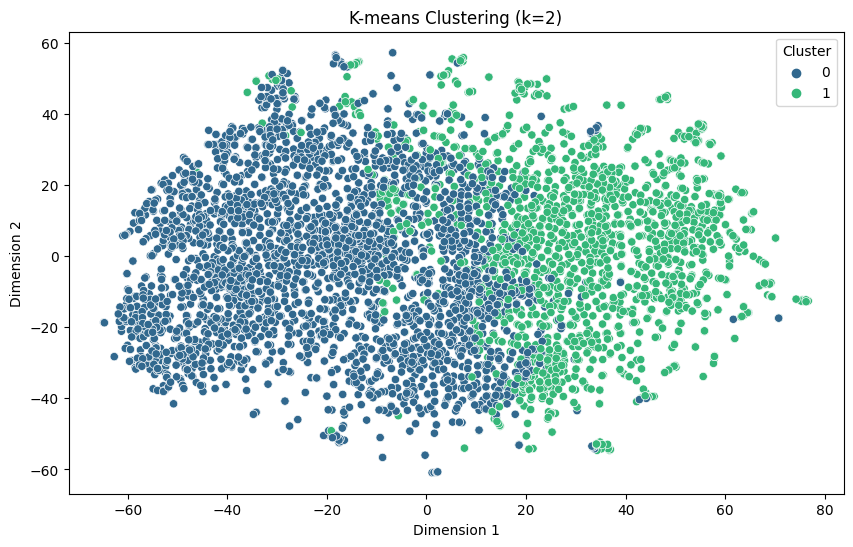

Cluster Subjects for k=2:
Cluster 0: Dominant Genre - fantasy
Cluster 1: Dominant Genre - thriller




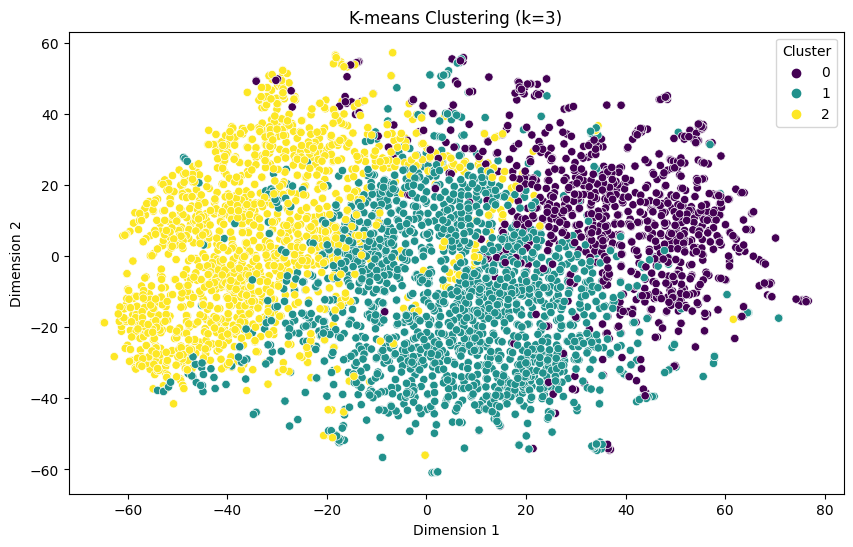

Cluster Subjects for k=3:
Cluster 0: Dominant Genre - crime
Cluster 1: Dominant Genre - fantasy
Cluster 2: Dominant Genre - science




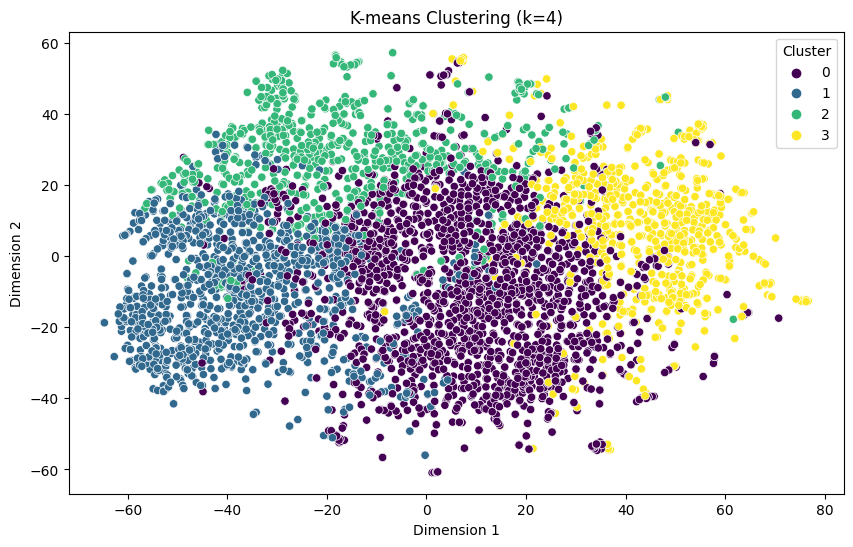

Cluster Subjects for k=4:
Cluster 0: Dominant Genre - thriller
Cluster 1: Dominant Genre - science
Cluster 2: Dominant Genre - thriller
Cluster 3: Dominant Genre - crime




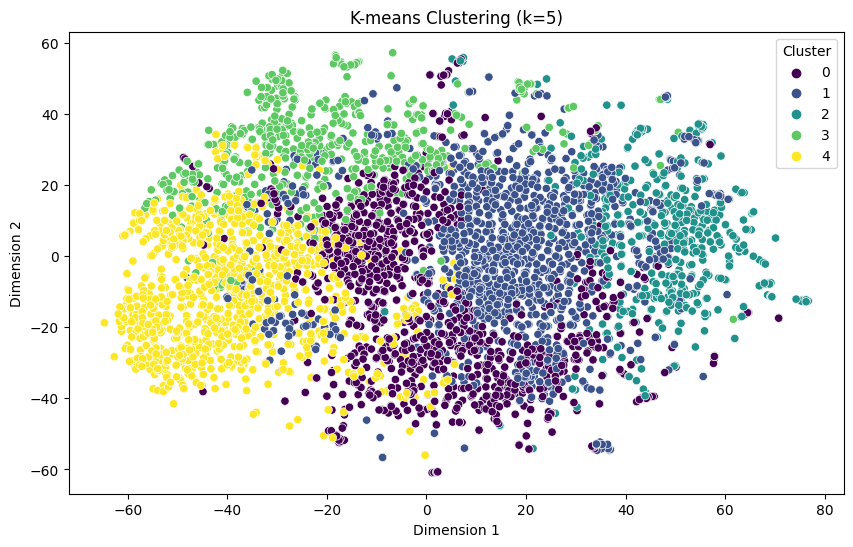

Cluster Subjects for k=5:
Cluster 0: Dominant Genre - fantasy
Cluster 1: Dominant Genre - thriller
Cluster 2: Dominant Genre - horror
Cluster 3: Dominant Genre - science
Cluster 4: Dominant Genre - science




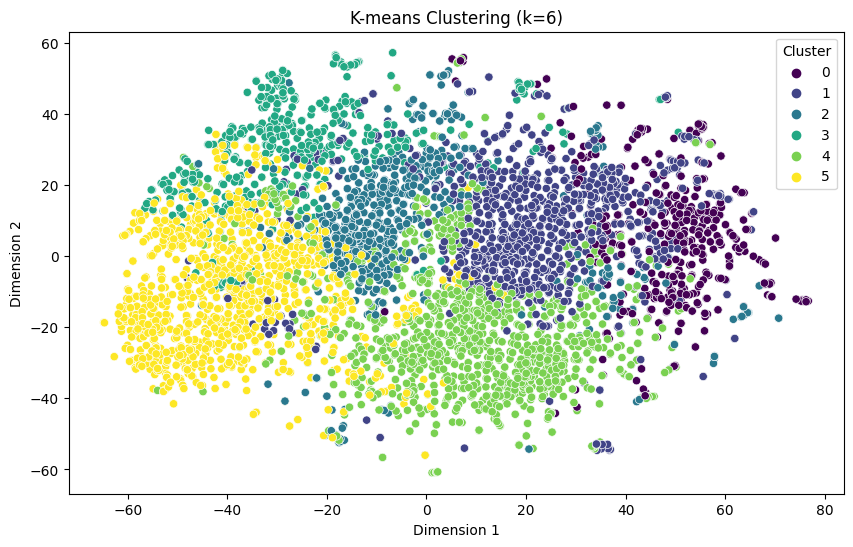

Cluster Subjects for k=6:
Cluster 0: Dominant Genre - horror
Cluster 1: Dominant Genre - crime
Cluster 2: Dominant Genre - fantasy
Cluster 3: Dominant Genre - science
Cluster 4: Dominant Genre - thriller
Cluster 5: Dominant Genre - science




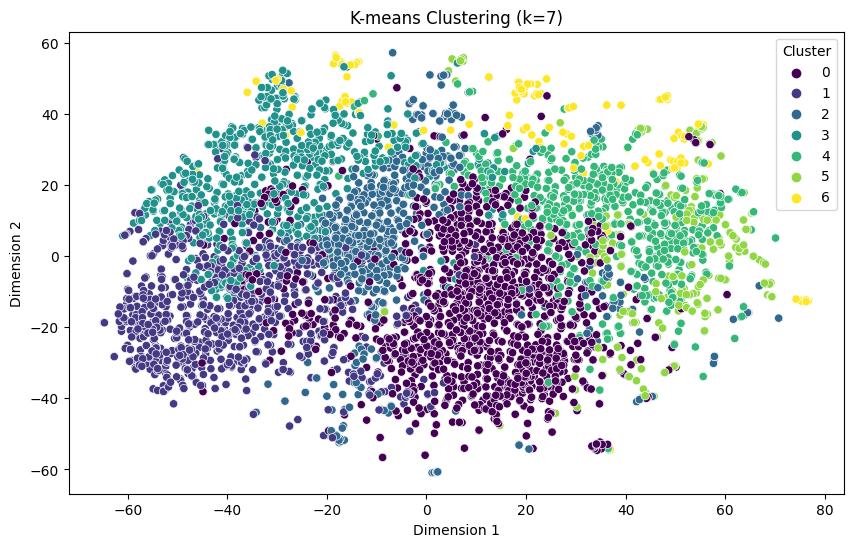

Cluster Subjects for k=7:
Cluster 0: Dominant Genre - thriller
Cluster 1: Dominant Genre - science
Cluster 2: Dominant Genre - fantasy
Cluster 3: Dominant Genre - science
Cluster 4: Dominant Genre - history
Cluster 5: Dominant Genre - horror
Cluster 6: Dominant Genre - history




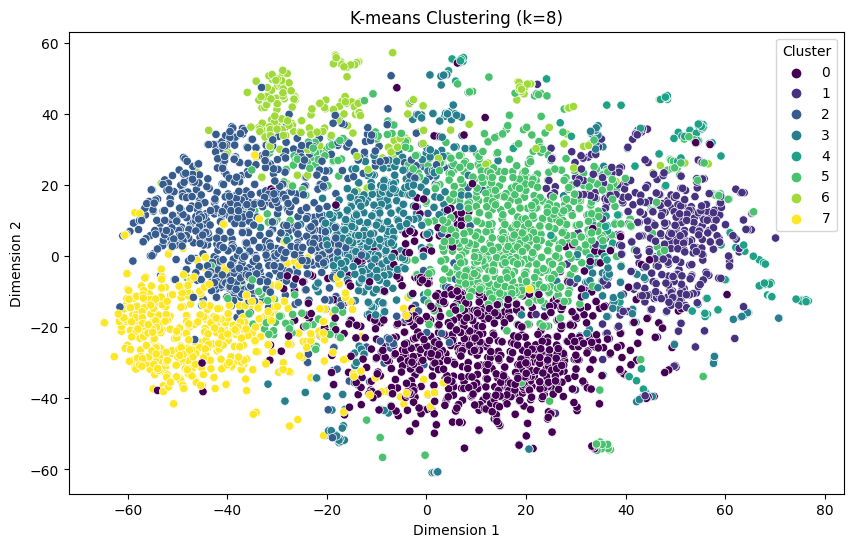

Cluster Subjects for k=8:
Cluster 0: Dominant Genre - thriller
Cluster 1: Dominant Genre - crime
Cluster 2: Dominant Genre - science
Cluster 3: Dominant Genre - fantasy
Cluster 4: Dominant Genre - horror
Cluster 5: Dominant Genre - thriller
Cluster 6: Dominant Genre - history
Cluster 7: Dominant Genre - science




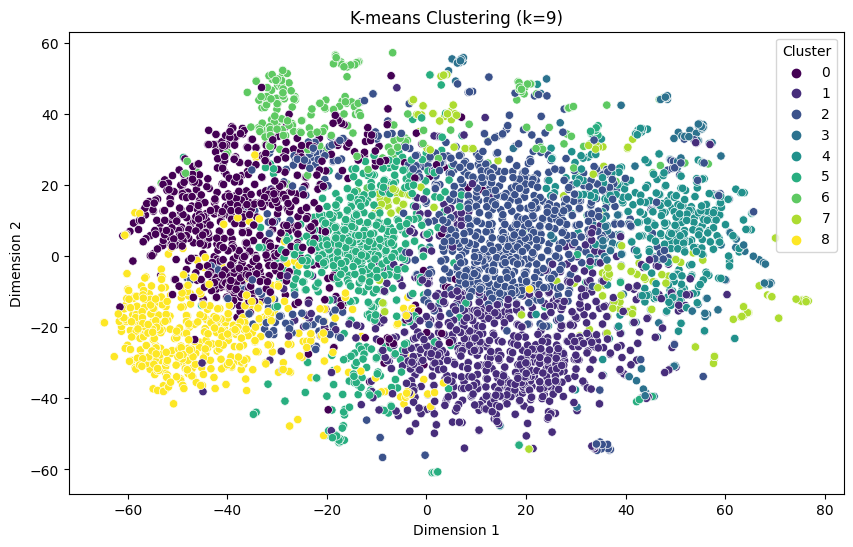

Cluster Subjects for k=9:
Cluster 0: Dominant Genre - science
Cluster 1: Dominant Genre - thriller
Cluster 2: Dominant Genre - thriller
Cluster 3: Dominant Genre - thriller
Cluster 4: Dominant Genre - crime
Cluster 5: Dominant Genre - fantasy
Cluster 6: Dominant Genre - history
Cluster 7: Dominant Genre - fantasy
Cluster 8: Dominant Genre - science




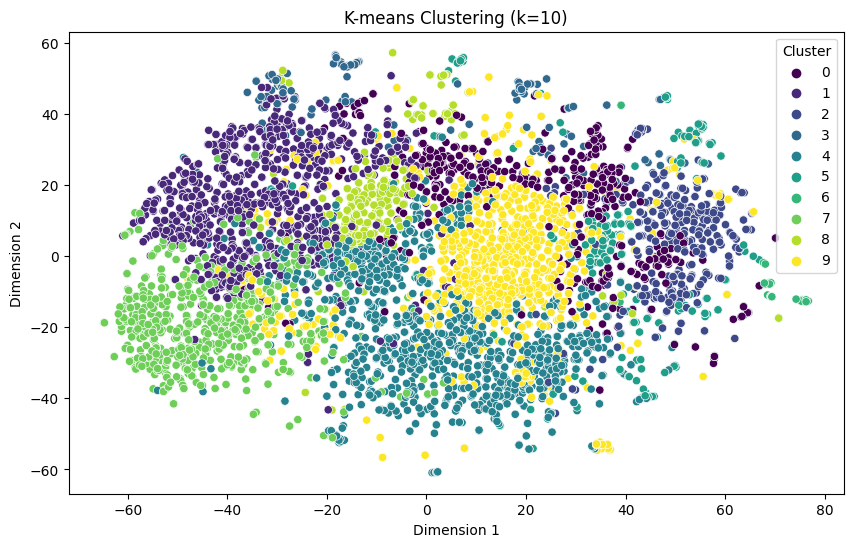

Cluster Subjects for k=10:
Cluster 0: Dominant Genre - history
Cluster 1: Dominant Genre - science
Cluster 2: Dominant Genre - crime
Cluster 3: Dominant Genre - history
Cluster 4: Dominant Genre - fantasy
Cluster 5: Dominant Genre - thriller
Cluster 6: Dominant Genre - horror
Cluster 7: Dominant Genre - science
Cluster 8: Dominant Genre - fantasy
Cluster 9: Dominant Genre - thriller




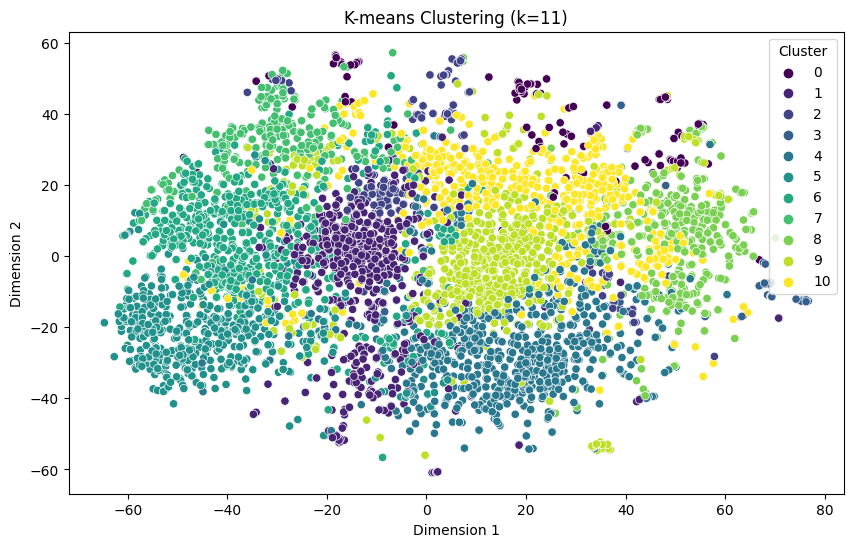

Cluster Subjects for k=11:
Cluster 0: Dominant Genre - history
Cluster 1: Dominant Genre - fantasy
Cluster 2: Dominant Genre - fantasy
Cluster 3: Dominant Genre - horror
Cluster 4: Dominant Genre - thriller
Cluster 5: Dominant Genre - science
Cluster 6: Dominant Genre - science
Cluster 7: Dominant Genre - thriller
Cluster 8: Dominant Genre - crime
Cluster 9: Dominant Genre - thriller
Cluster 10: Dominant Genre - history




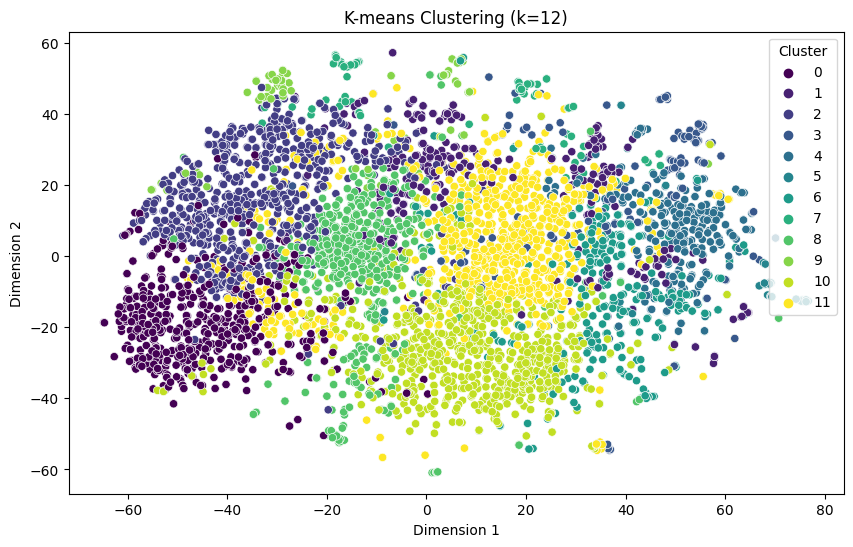

Cluster Subjects for k=12:
Cluster 0: Dominant Genre - science
Cluster 1: Dominant Genre - fantasy
Cluster 2: Dominant Genre - science
Cluster 3: Dominant Genre - thriller
Cluster 4: Dominant Genre - crime
Cluster 5: Dominant Genre - horror
Cluster 6: Dominant Genre - thriller
Cluster 7: Dominant Genre - history
Cluster 8: Dominant Genre - fantasy
Cluster 9: Dominant Genre - science
Cluster 10: Dominant Genre - thriller
Cluster 11: Dominant Genre - thriller




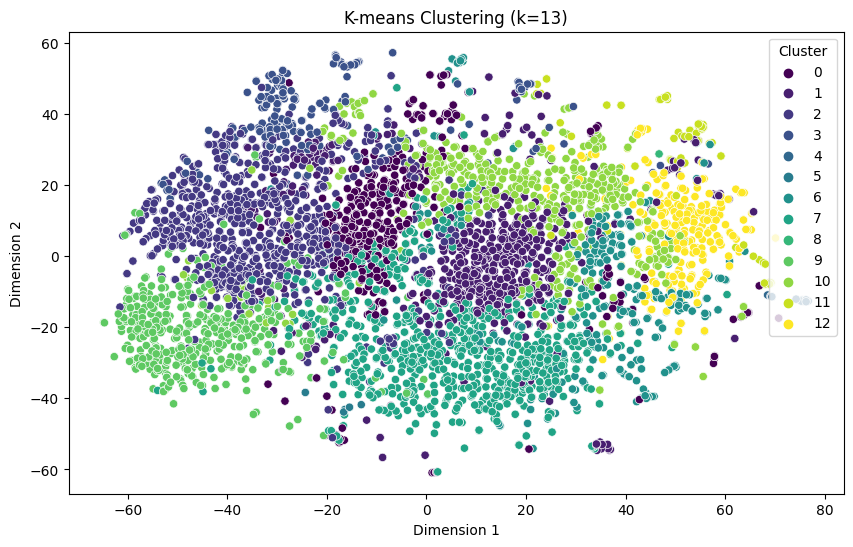

Cluster Subjects for k=13:
Cluster 0: Dominant Genre - fantasy
Cluster 1: Dominant Genre - thriller
Cluster 2: Dominant Genre - science
Cluster 3: Dominant Genre - science
Cluster 4: Dominant Genre - horror
Cluster 5: Dominant Genre - fantasy
Cluster 6: Dominant Genre - thriller
Cluster 7: Dominant Genre - thriller
Cluster 8: Dominant Genre - crime
Cluster 9: Dominant Genre - science
Cluster 10: Dominant Genre - history
Cluster 11: Dominant Genre - thriller
Cluster 12: Dominant Genre - crime




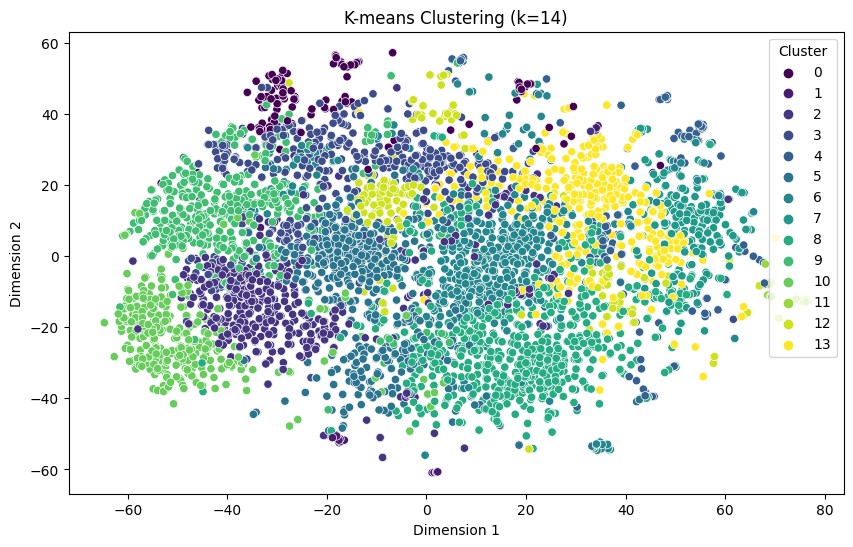

Cluster Subjects for k=14:
Cluster 0: Dominant Genre - history
Cluster 1: Dominant Genre - horror
Cluster 2: Dominant Genre - history
Cluster 3: Dominant Genre - history
Cluster 4: Dominant Genre - thriller
Cluster 5: Dominant Genre - fantasy
Cluster 6: Dominant Genre - thriller
Cluster 7: Dominant Genre - crime
Cluster 8: Dominant Genre - thriller
Cluster 9: Dominant Genre - science
Cluster 10: Dominant Genre - science
Cluster 11: Dominant Genre - horror
Cluster 12: Dominant Genre - fantasy
Cluster 13: Dominant Genre - history




In [93]:
# Using k-means create clusters and plot the results for different values of k
k_values = [i for i in range(2, 15)]
for k in k_values:
    # kmeans_model = KMeans(n_clusters=k, random_state=42)
    # kmeans_labels = kmeans_model.fit_predict(X)
    centroids, labels, iters = kmeans(X, k)
    kmeans_labels = labels


    # Plot Clustering Results
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=X_2d[:, 0], y=X_2d[:, 1], hue=kmeans_labels, palette='viridis', legend='full')
    plt.title(f'K-means Clustering (k={k})')
    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')
    plt.legend(title='Cluster')
    plt.show()

    # Print Cluster Subjects
    print(f"Cluster Subjects for k={k}:")
    for cluster_id in range(k):
        cluster_docs = df[kmeans_labels == cluster_id]
        common_genre = cluster_docs['genre'].value_counts().idxmax()
        print(f"Cluster {cluster_id}: Dominant Genre - {common_genre}")
    print("\n")

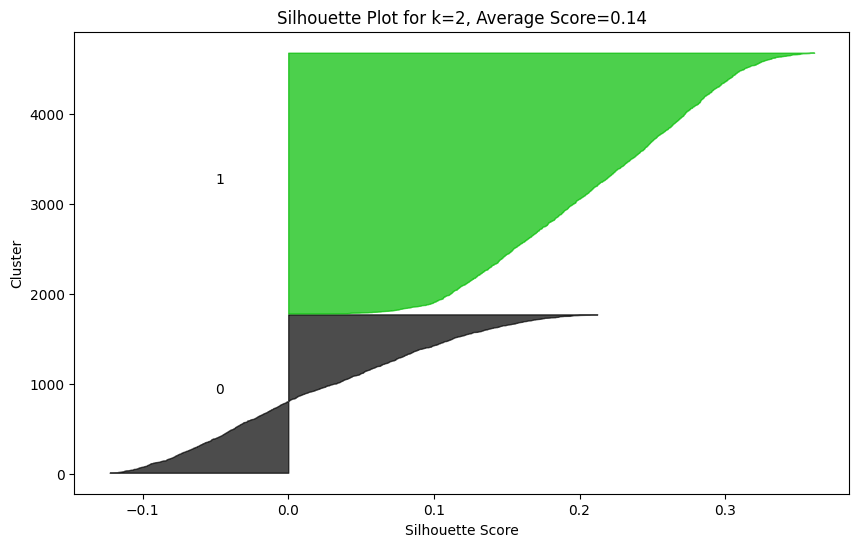

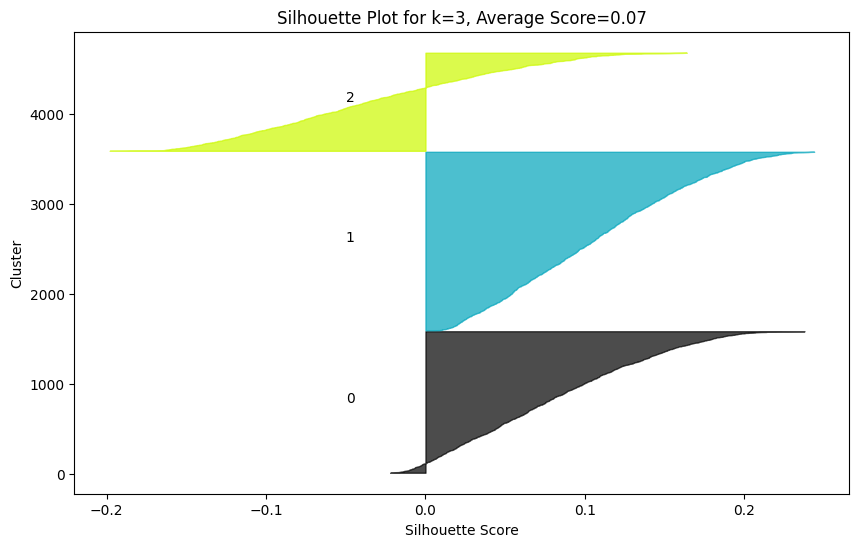

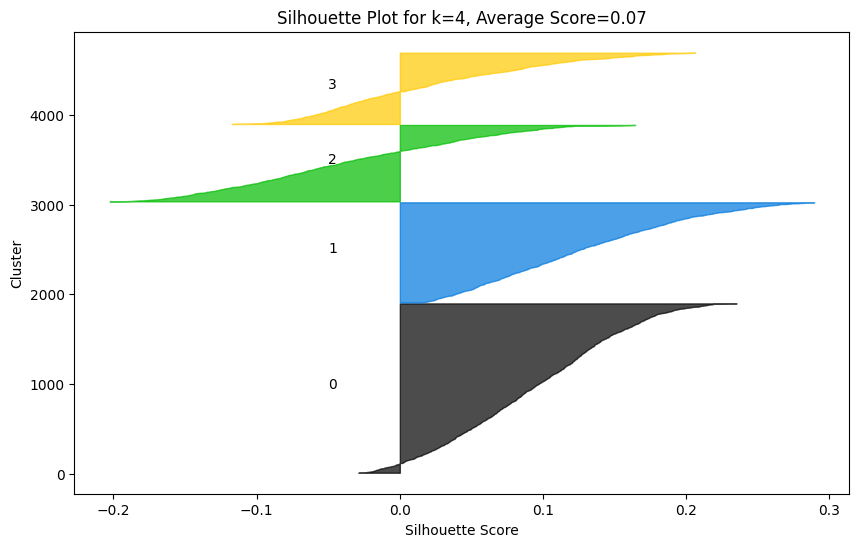

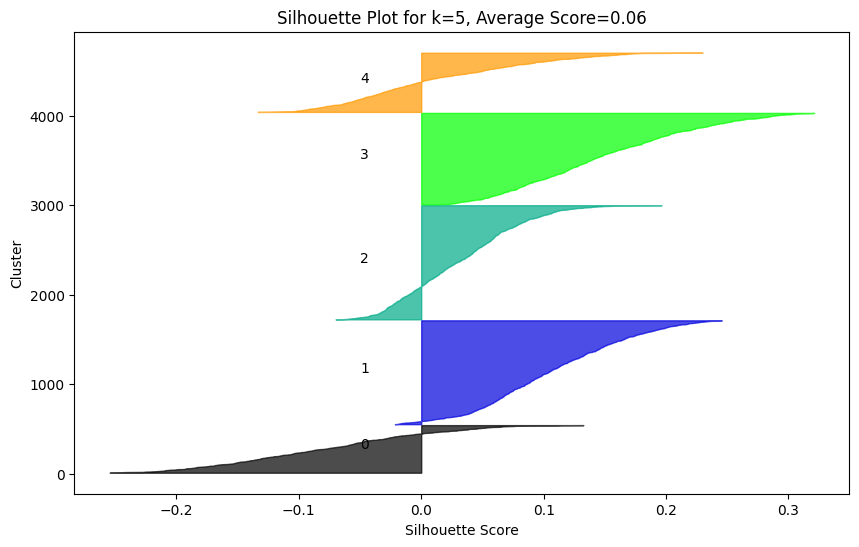

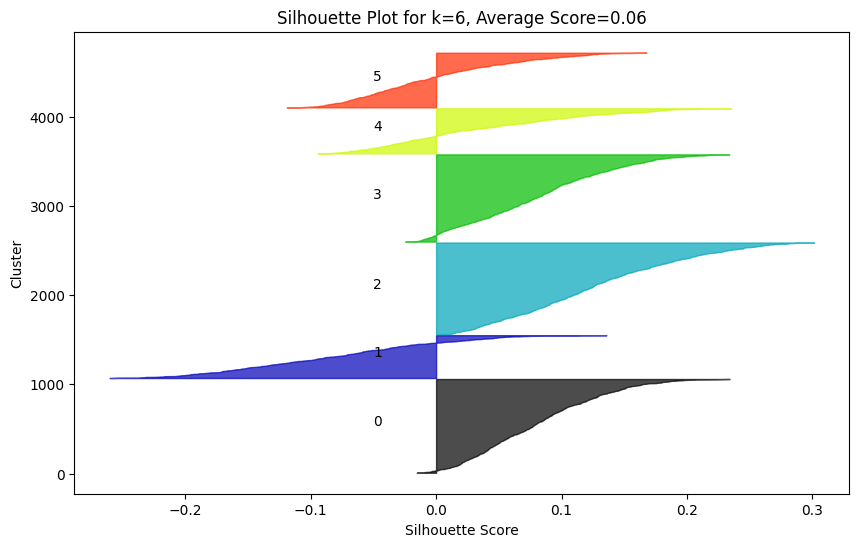

...

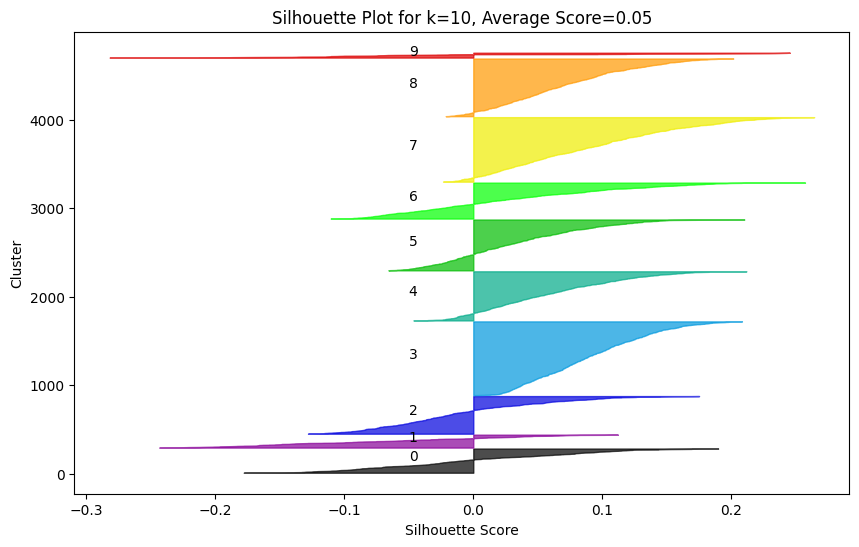

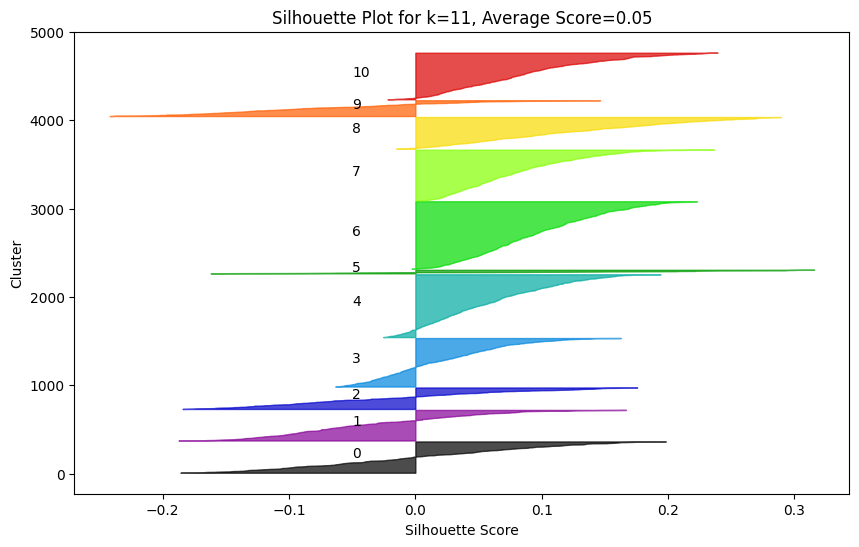

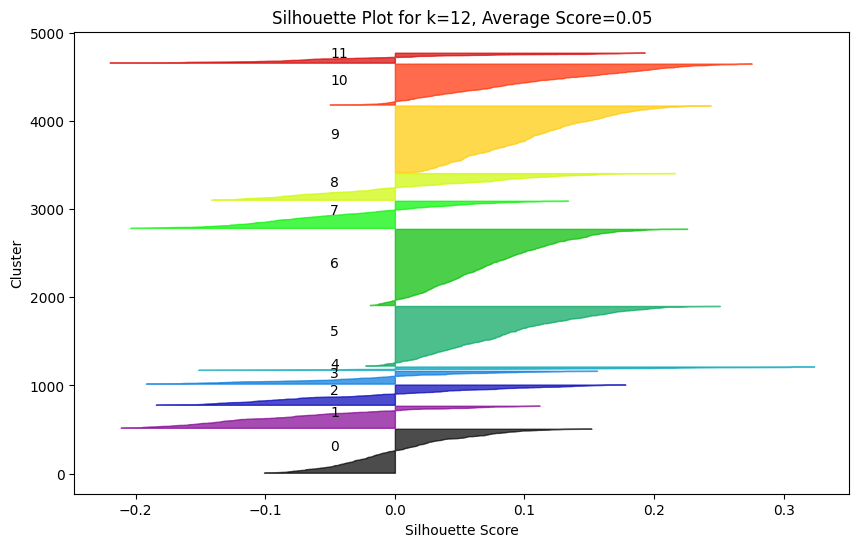

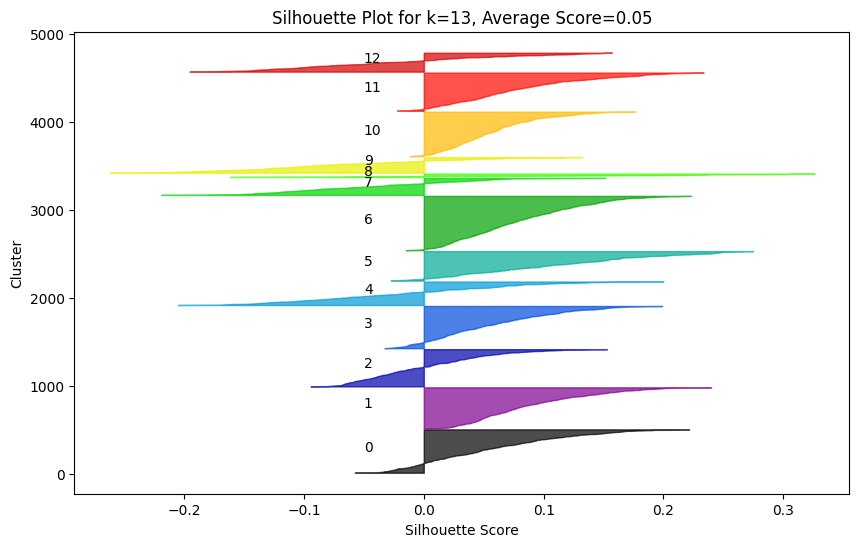

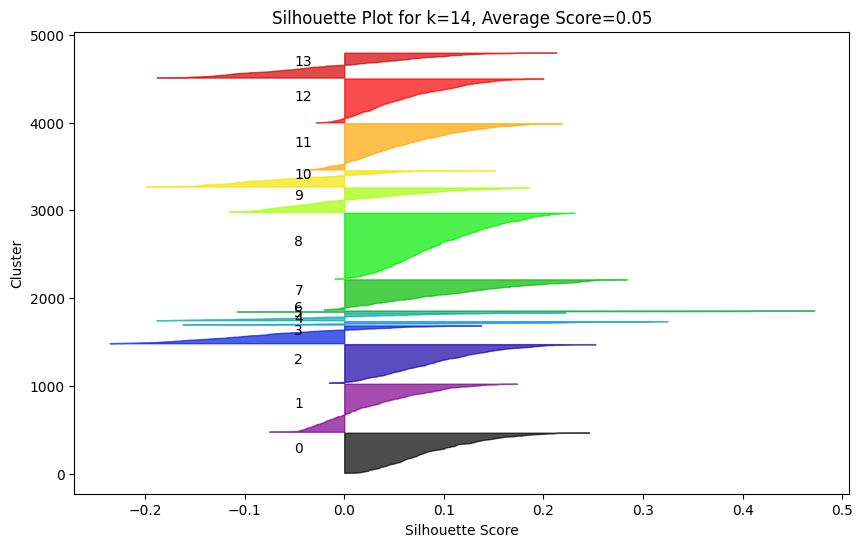

In [94]:
from sklearn.metrics import silhouette_samples
import matplotlib.cm as cm  # Add this line for importing cm

# Using k-means create clusters and plot silhouette scores for different values of k
for k in k_values:
    # kmeans_model = KMeans(n_clusters=k, random_state=42)
    # kmeans_labels = kmeans_model.fit_predict(X)
    centroids, labels, iters = kmeans(X, k)
    kmeans_labels = labels

    # Plot Silhouette Scores
    plt.figure(figsize=(10, 6))
    silhouette_avg = silhouette_score(X, kmeans_labels)
    sample_silhouette_values = silhouette_samples(X, kmeans_labels)

    y_lower = 10
    for i in range(k):
        ith_cluster_silhouette_values = sample_silhouette_values[kmeans_labels == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / k)
        plt.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for the next plot
        y_lower = y_upper + 10

    plt.title(f'Silhouette Plot for k={k}, Average Score={silhouette_avg:.2f}')
    plt.xlabel('Silhouette Score')
    plt.ylabel('Cluster')
    plt.show()

In [95]:

# def purity_score(y_true, y_pred):
#     """
#     Calculate the purity score for the given cluster assignments and ground truth classes

#     y_true: list
#         ground truth labels for each document

#     y_pred: list
#         predicted labels for each document

#     Returns a purity score between 0.0 and 1.0 (higher is better)
#     """
#     #TODO
#     pass

def purity_score(y_true, y_pred):
    """
    Calculate the purity score for the given cluster assignments and ground truth classes

    y_true: list
        ground truth labels for each document

    y_pred: list
        predicted labels for each document

    Returns a purity score between 0.0 and 1.0 (higher is better)
    """
    contingency_matrix = sklearn.metrics.cluster.cluster.pair_confusion_matrix(y_true, y_pred)
    purity = np.sum(np.amax(contingency_matrix, axis=0)) / np.sum(contingency_matrix)
    return purity

In [ ]:
# TODO: Calculate silhouette score and purity score

In [ ]:
# TODO: Plot silhouette score for different value of k (at least 5 different k values)

In [ ]:
#TODO: plot purity for different value of k (at least 5 different k values)

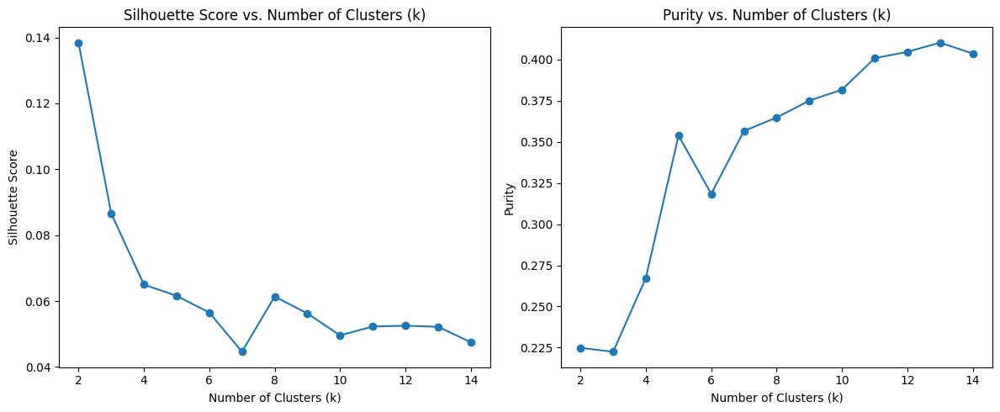

In [96]:
from sklearn.preprocessing import LabelEncoder

# Lists to store silhouette and purity scores
silhouette_scores = []
purity_scores = []

# Encode 'genre' labels to numeric values
label_encoder = LabelEncoder()
y_true_encoded = label_encoder.fit_transform(df['genre'])

# TODO: Calculate silhouette score and purity score for different values of k
for k in k_values:
    centroids, labels, iters = kmeans(X, k)
    kmeans_labels = labels

    # Silhouette Score
    silhouette_avg = silhouette_score(X, kmeans_labels)
    silhouette_scores.append(silhouette_avg)

    # Purity Score
    confusion_mat = confusion_matrix(y_true_encoded, kmeans_labels)
    purity = np.sum(np.amax(confusion_mat, axis=0)) / np.sum(confusion_mat)
    purity_scores.append(purity)

# TODO: Plot silhouette score for different values of k
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(k_values, silhouette_scores, marker='o')
plt.title('Silhouette Score vs. Number of Clusters (k)')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')

# TODO: Plot purity for different values of k
plt.subplot(1, 2, 2)
plt.plot(k_values, purity_scores, marker='o')
plt.title('Purity vs. Number of Clusters (k)')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Purity')

plt.tight_layout()
plt.show()

<div dir="rtl">
با استفاده از نمودارهای رسم شده توضیح دهید بهترین k برای انتخاب در داده ما با استفاده از الگوریتم K-Means چیست؟
چرا؟
</div>

<span style="color: red;">k=10 is a good choice because it has a pretty good purity score  and silhouette score.</span>

<div dir="rtl">
<h3>3-2-2.
Hierarchical clustering
</h3>
</div>

<div dir="rtl">
تکنیک خوشه‌بندی سلسله مراتبی یکی از تکنیک‌های خوشه‌بندی در یادگیری ماشین است. در این قسمت شما می‌توانید از لایببری scipy یا هر لایبرری دیگری در پایتون استفاده کنید تا داده‌ها را به صورت سلسله‌مراتبی خوشه‌بندی کنید. سپس می‌توانید خوشه‌ها را با matplotlib مشاهده کنید.
</div>

In [97]:
# Hierarchical Clustering
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt

In [98]:
# Perform hierarchical clustering on X
linkage_matrix = linkage(X, method='ward', metric='euclidean')

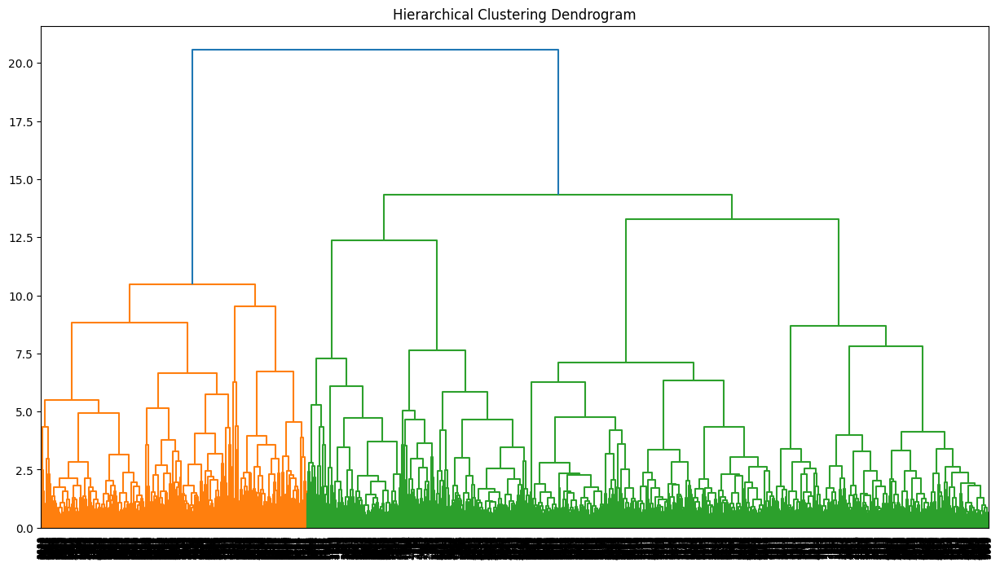

In [99]:
# Plot dendrogram
plt.figure(figsize=(15, 8))
dendrogram(linkage_matrix, leaf_rotation=90, leaf_font_size=8)
plt.title("Hierarchical Clustering Dendrogram")
plt.show()